### Import of libraries

In [ ]:
import os
import io

import cv2
import numpy as np
import matplotlib.pyplot as plt

from improutils import *
from google.cloud import vision

import pytesseract

%matplotlib inline
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

## Task

### First Part - Document Alignment and Subsequent OCR Application
The task involves working with the file `ocr_img.jpg`, which contains a document of known dimensions (A4 paper). The document needs to be transformed into a perpendicular view, followed by utilizing `pytesseract` for automated text extraction using OCR.

![](ocr_img.jpg)

Load an image, display it, and save an array of target correspondence coordinates for the corners of a document.

In [ ]:
image = load_image("ocr_img.jpg")

real_world_pts = np.array([(0, 0), (2100, 0), (2100, 2970), (0, 2970)])

Select the image coordinates of the corners of the document using graphic editor (`GIMP`, for example).

format: x, y 
 [[ 725 1118]
 [ 150  559]
 [ 976  117]
 [1556  453]]


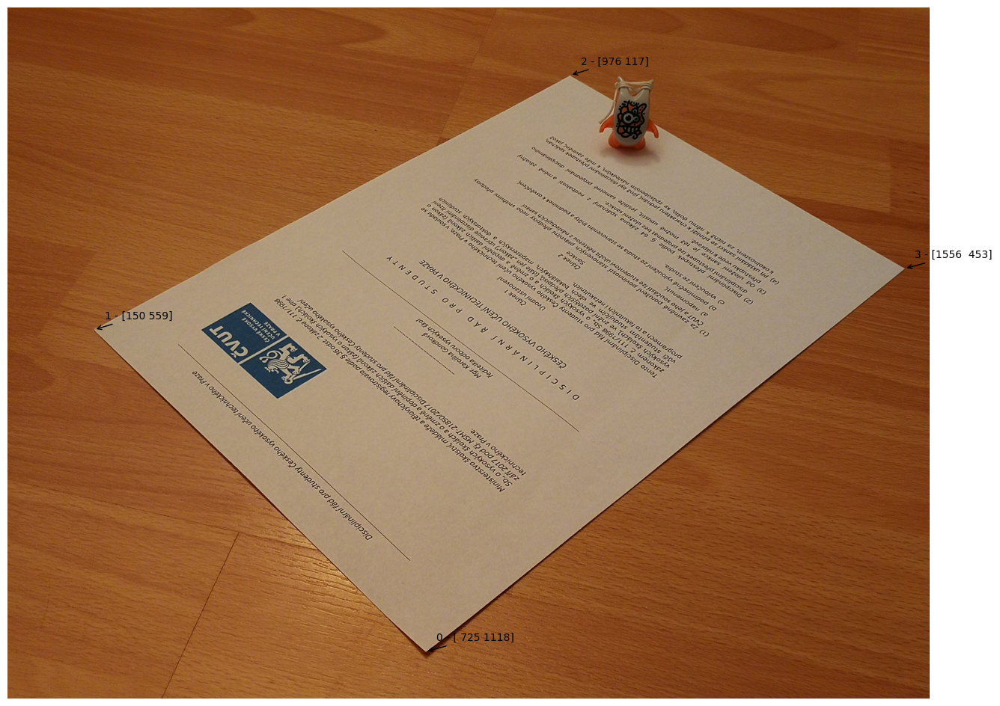

In [ ]:
image_pts = np.array([(725, 1118), (150, 559), (976, 117), (1556, 453)])

if (len(image_pts) != len(real_world_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(image)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

Calculate the transformation matrix **H**.

In [ ]:
H, mask = cv2.findHomography(image_pts, real_world_pts)
print(H)

[[-2.205 -2.756 4680.084]
 [2.435 -2.505 1034.981]
 [-0.000 0.001 1.000]]


Create an orthogonal view of a document using function [`cv2.warpPerspective`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#gaf73673a7e8e18ec6963e3774e6a94b87).

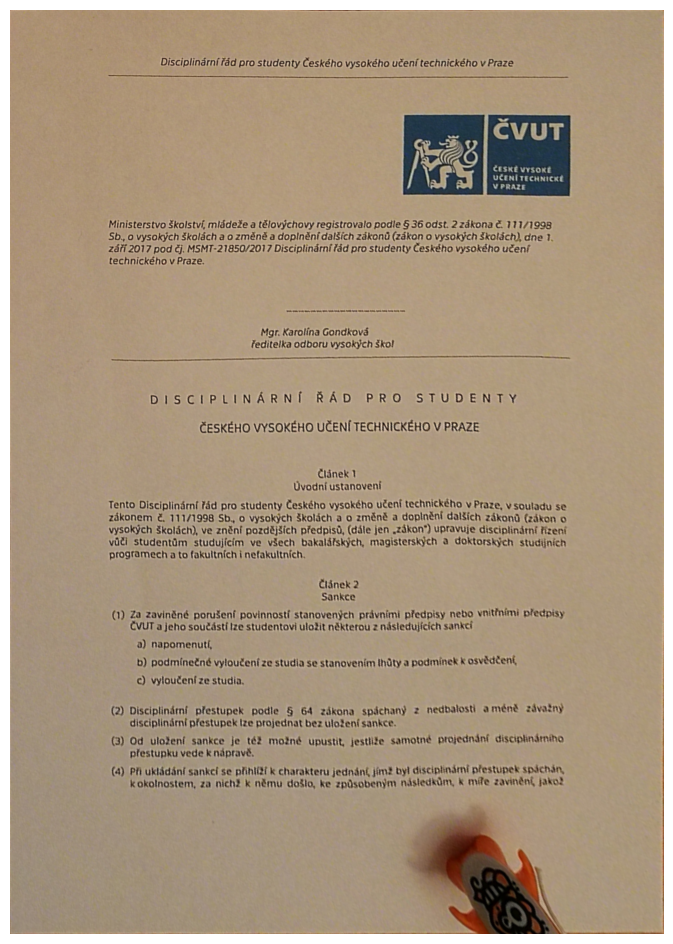

In [ ]:
warped_img = cv2.warpPerspective(image, H, (2100, 2970))
plot_images(warped_img)

The difference between [`cv2.getPerspectiveTransform()`](https://docs.opencv.org/3.4.1/da/d54/group__imgproc__transform.html#ga8c1ae0e3589a9d77fffc962c49b22043) a [`cv2.findHomography`](https://docs.opencv.org/3.4.1/d9/d0c/group__calib3d.html#ga4abc2ece9fab9398f2e560d53c8c9780):

One of the differences lies in the number of points required for the methods. **cv.getPerspectiveTransform()** specifically requires exactly 4 points. In **cv.findHomography()**, there is no fixed requirement for the number of points. The first function returns a `3x3 perspective transformation matrix`, while the second function returns a transformation matrix of any size along with an optional mask. This mask can be useful for outlier rejection, helping to identify and discard points that don't conform well to the transformation.

To sum up, **cv.getPerspectiveTransform()** is designed specifically for 2D perspective transformations in a planar scene. It assumes a planar object in both the source and destination images. **cv.findHomography()** is a more general function that can estimate a projective transformation between two sets of points in any dimensions.

Detect text using pytesseract.

In [ ]:
text = pytesseract.image_to_string(warped_img, lang='ces')
print(text)

 

Disciplinární řád pro studenty Českého vysokého učení technického v Praze

at

ET SET
S RST aa
VAZ TV 3

 

Ministerstvo školství, mládeže a tělovýchovy registrovalo podle $ 36 odst 2 zákona č 111/1998
Sb., o vysokých školách a o změně a doplnění dalších zákonů (zákon o vysokých školách) dne 1.
září 2017 pod čj. MSMT-21850/2017 Disciplinární řád pro studenty Českého vysokého učení
technického v Praze.

Mgr. Karolína Gondková
ředitelka odboru vysokých ško!

oo nO VAV PAPO AEAUOVAV OA AAA SVR VVVAAAADAAAAAŘAnanánAondo n n nadao0o ooo ooně

DISCIPLINÁRNÍ ŘÁD PRO STUDENTY

ČESKÉHO VYSOKÉHO UČENÍ TECHNICKÉHO V PRAZE

Člšnek 1
Úvodní ustanovení

Tento Disciplinární řád pro studenty Českého vysokého učení technického v Praze, v souladu se
zákonem č. 111/1998 Sb., o vysokých školách a o změně a doplnění dalších zákonů (zákon o
vysokých školách), ve znění pozdějších předpisů, (dále jen „zákon“) upravuje disciplinární řízení
vůči studentům studujícím ve všech bakalářských, magisterských a dok

Save the text in a text file.

In [ ]:
with open("detected_text.txt", "w") as file:
    file.write(text)

Overall, text recognition was more or less successful. The text appears to be understandable. In two places, unclear characters appeared where there is no text at all. Some letters in certain words were inaccurately recognized, but it is still possible to `understand the essence` of the text. I tried to perform segmentation and filtering, experiment with brightness and contrast, passed a binary mask to pytesseract as a function argument, but particularly better results could not be achieved.

### Second Part - Fine Arts at FIT
The task involves working with the photograph `fit_budova.jpg` and the painting `fit_logo.jpg`. The goal is to place the logo image on the wall of the FIT building.

![](fit_logo_merged.jpg)

Load an image, display it, and save an array of target correspondence coordinates for the corners of a logo (agian using a graphic editor).

In [ ]:
main_img = load_image("fit_budova.jpg")
logo_img = load_image("fit_logo.jpg")

logo_pts = np.array([(0, 0), (140, 0), (140, 718), (0, 718)])

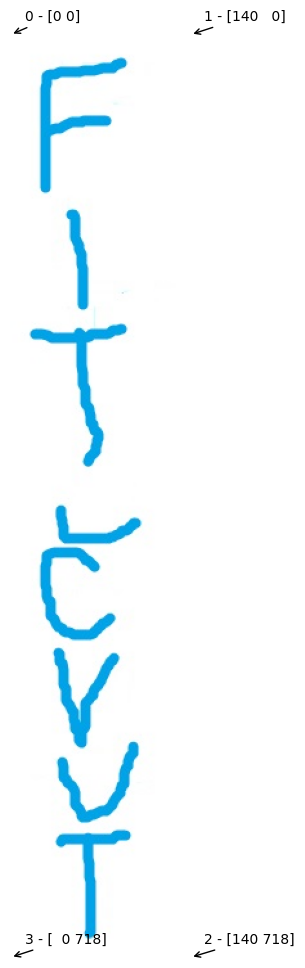

In [ ]:
plot_images(logo_img)
for i, pt in enumerate(logo_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

Select the coordinates in the image to which the logo should be transformed.

format: x, y 
 [[191  47]
 [240  70]
 [155 404]
 [ 89 405]]


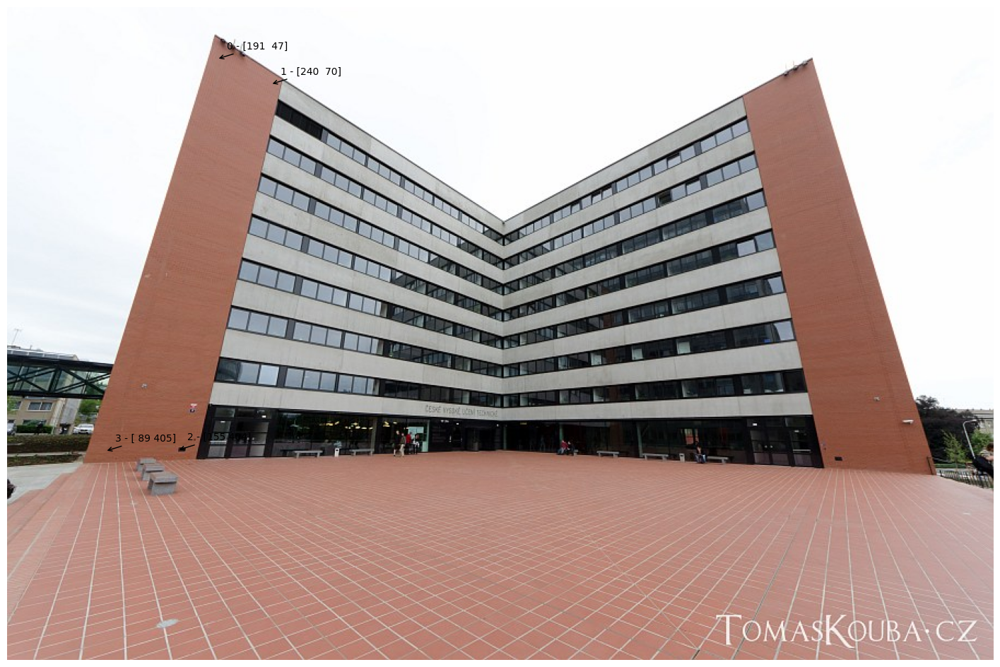

In [ ]:
image_pts = np.array([(191, 47), (240, 70), (155, 404), (89, 405)])
if (len(image_pts) != len(logo_pts)):
    raise ValueError('Real world points and image points must be the same size.')

print('format: x, y \n', image_pts)

plot_images(main_img)
for i, pt in enumerate(image_pts):
    plt.annotate(str(i) + " - " + str(pt), xy=pt, textcoords="offset points", xytext=(10,10), arrowprops=dict(arrowstyle="->"))

Calculate the transformation matrix **H**.

In [ ]:
H, mask = cv2.findHomography(logo_pts, image_pts)
print(H)

[[0.472 -0.163 191.000]
 [0.200 0.405 47.000]
 [0.001 -0.000 1.000]]


Create the same perspective for the logo as for the building photo using `cv2.warpPerspective()`.

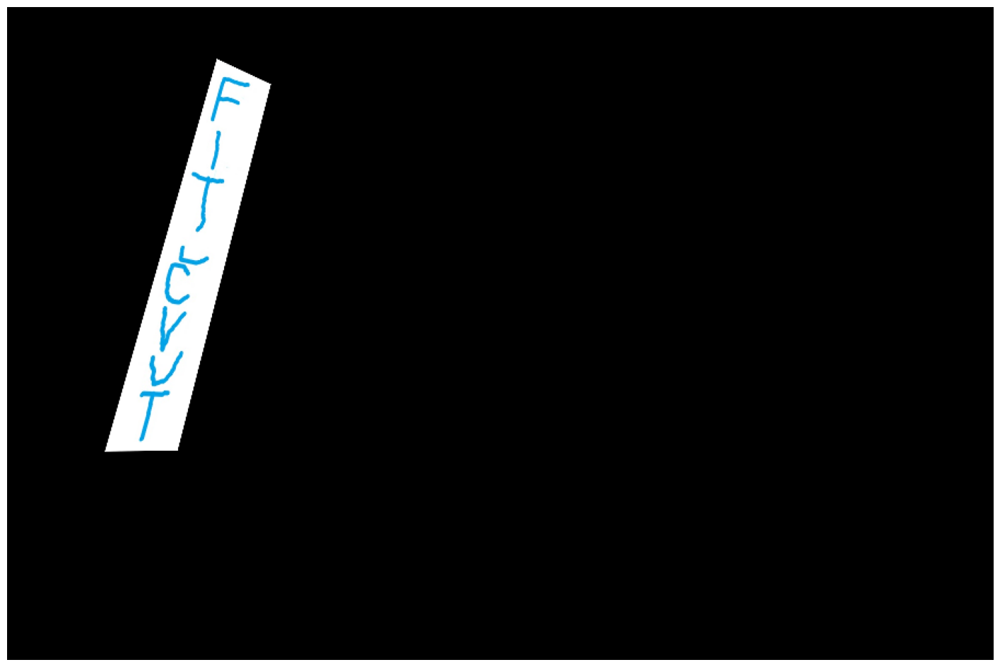

In [ ]:
warped_logo = cv2.warpPerspective(logo_img, H, (main_img.shape[1], main_img.shape[0]))
plot_images(warped_logo)

Now we need to segment our logo. We will try to use different types of object segmentation in the image and different image filtering functions. Let's start with automatic thresholding and the use of the **filtration_median()** function.

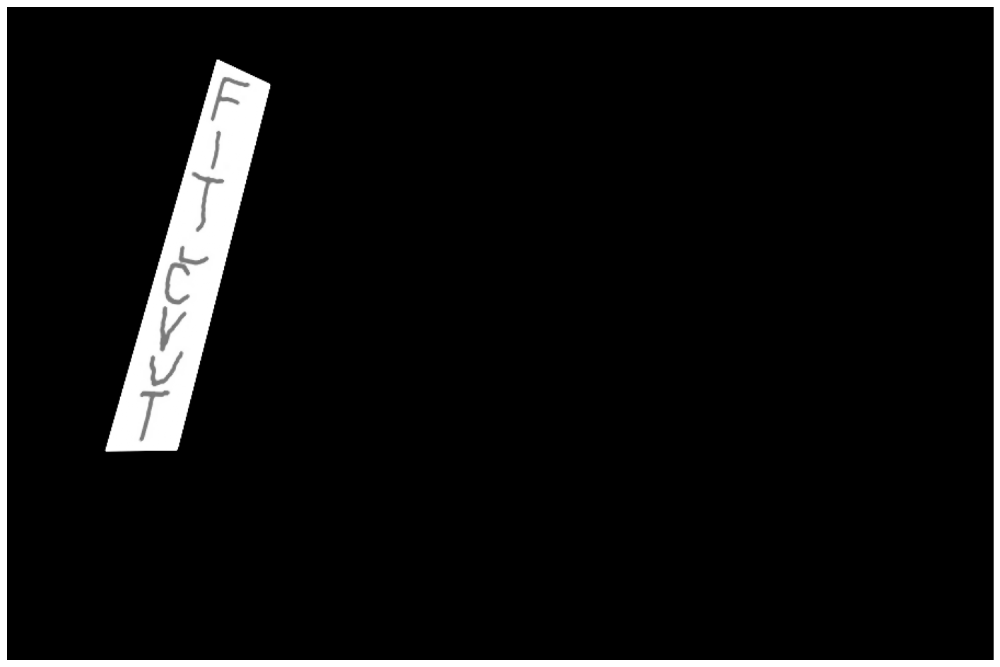

In [ ]:
gray_warped_logo = to_gray(warped_logo)
gray_warped_logo = filtration_median(gray_warped_logo, 3)
plot_images(gray_warped_logo)

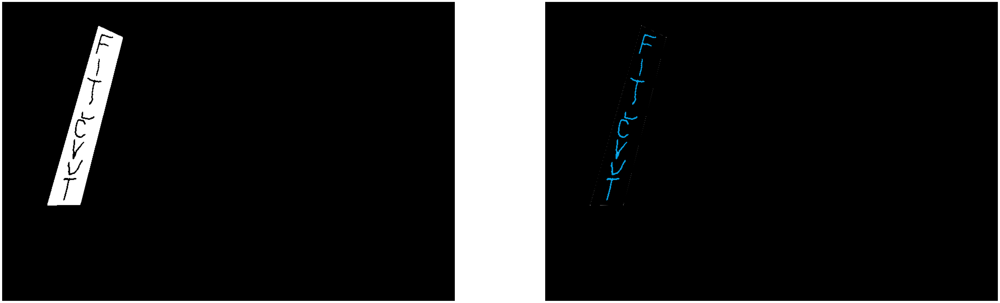

In [ ]:
mask = segmentation_auto_threshold(gray_warped_logo)
plot_images(mask, apply_mask(warped_logo, negative(mask)))

Now use **segmentation_adaptive_threshold()**.

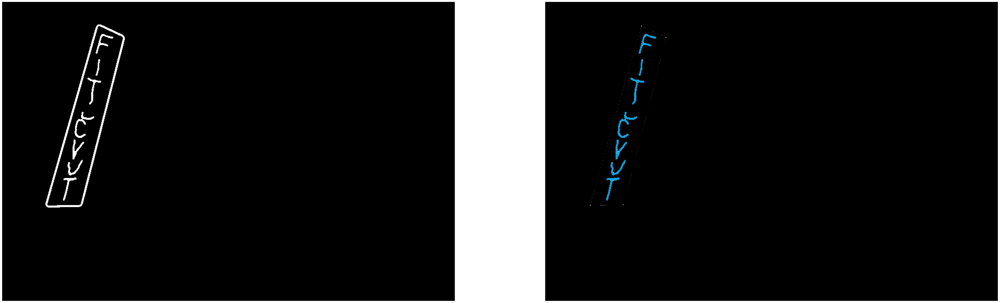

In [ ]:
gray_warped_logo = to_gray(warped_logo)
gray_warped_logo = filtration_median(gray_warped_logo, 5)

mask = segmentation_adaptive_threshold(gray_warped_logo, 11, 5)
plot_images(negative(mask), apply_mask(warped_logo, negative(mask)))

The results are almost the same. The only difference is that the letter `'V' looks slightly more volumetric`, which could indicate either that automatic segmentation does not segment some blue pixels, or that adaptive thresholding segments unnecessary pixels. Now let's try **segmentation_two_thresholds**.

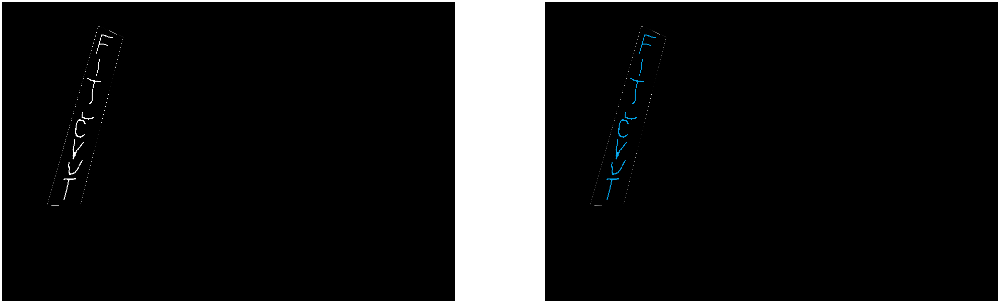

In [ ]:
gray_warped_logo = to_gray(warped_logo)
gray_warped_logo = filtration_box(gray_warped_logo, 3)

mask = segmentation_two_thresholds(gray_warped_logo, 120, 150)
plot_images(mask, apply_mask(warped_logo, mask))

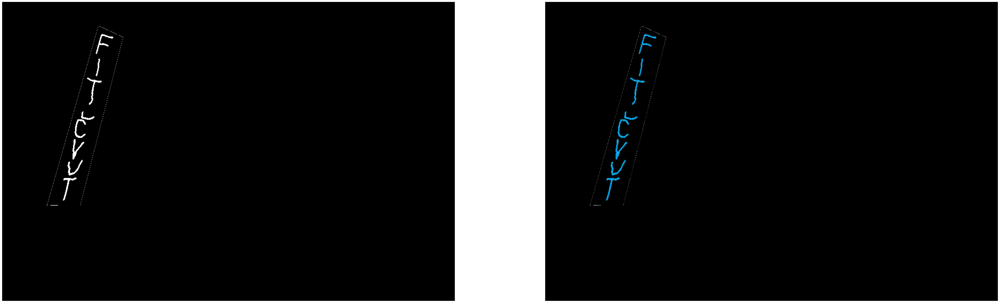

In [ ]:
gray_warped_logo = to_gray(warped_logo)
gray_warped_logo = filtration_gauss(gray_warped_logo, 3, -0)

mask = segmentation_two_thresholds(gray_warped_logo, 120, 170)
plot_images(mask, apply_mask(warped_logo, mask))

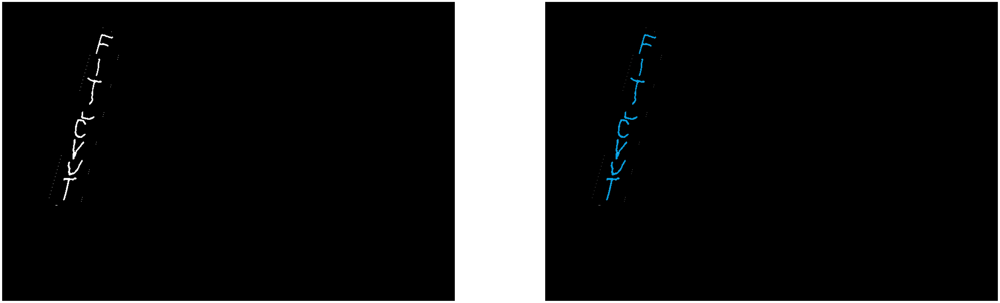

In [ ]:
gray_warped_logo = to_gray(warped_logo)
gray_warped_logo = filtration_median(gray_warped_logo, 3)

mask = segmentation_two_thresholds(gray_warped_logo, 120, 150)
plot_images(mask, apply_mask(warped_logo, mask))

In the case of **filtration_box()** and **filtration_gauss()**, a white contour appears around the photo, indicating that segmentation is not very successful. The best performance is achieved with **filtration_median()**. As for this type of segmentation, the result is almost identical to automatic segmentation. It can also be noted that the hook above the letter 'č' in the original logo photo is clearly separated, as it is **after segmentation_two_thresholds()**, unlike adaptive segmentation, where this letter is segmented as one object. So, considering all the above, I will finally obtain the mask using **segmentation_two_thresholds()** after applying **filtration_median()**.

Let's check if there are any unnecessary contours in our mask.

8


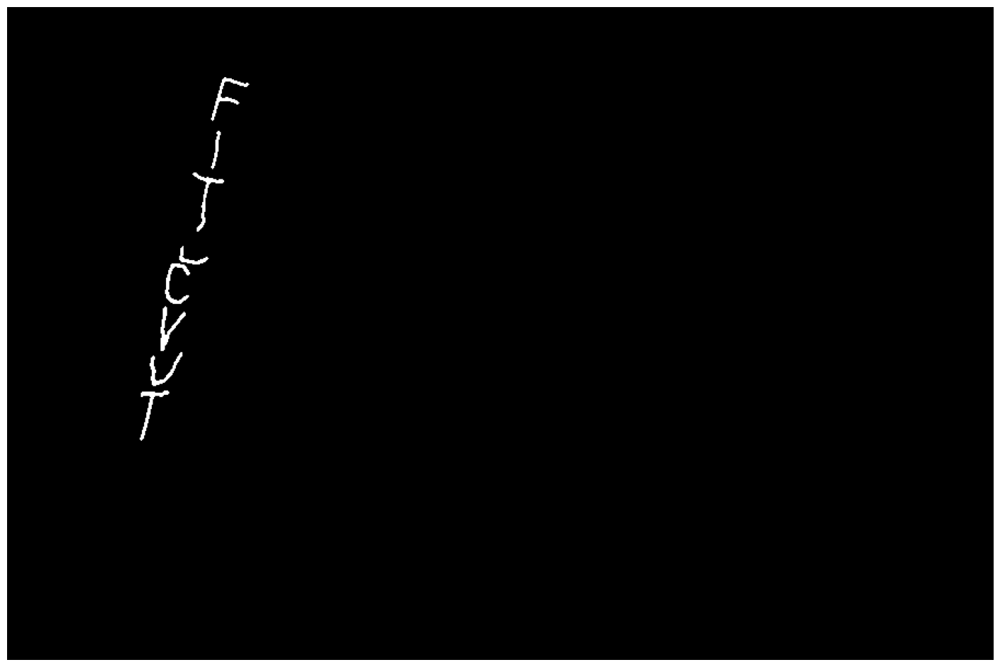

In [ ]:
contours_drawn, num_contours, contours = find_contours(mask)
print(num_contours)
plot_images(contours_drawn)

Everything is okay. Save logo after segmentation.

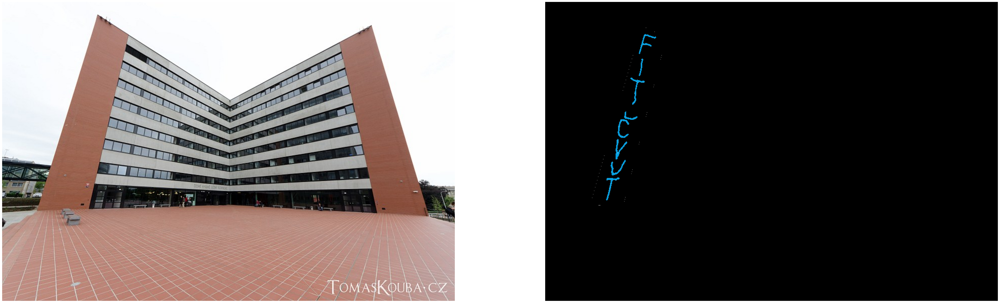

In [ ]:
logo_to_merge = apply_mask(warped_logo, mask)
plot_images(main_img, logo_to_merge)

Create a function for merging images and merge the source photo of the building with the segmented logo.

In [ ]:
def merge_images(basic_img, img_to_merge):
    if basic_img.shape != img_to_merge.shape:
        raise ValueError("Images must be the same size.")

    merged_img = basic_img.copy()
    for x in range(basic_img.shape[0]):
        for y in range(basic_img.shape[1]):
            if any(color_intensity != 0 for color_intensity in img_to_merge[x, y]):
                merged_img[x, y] = img_to_merge[x, y]

    return merged_img

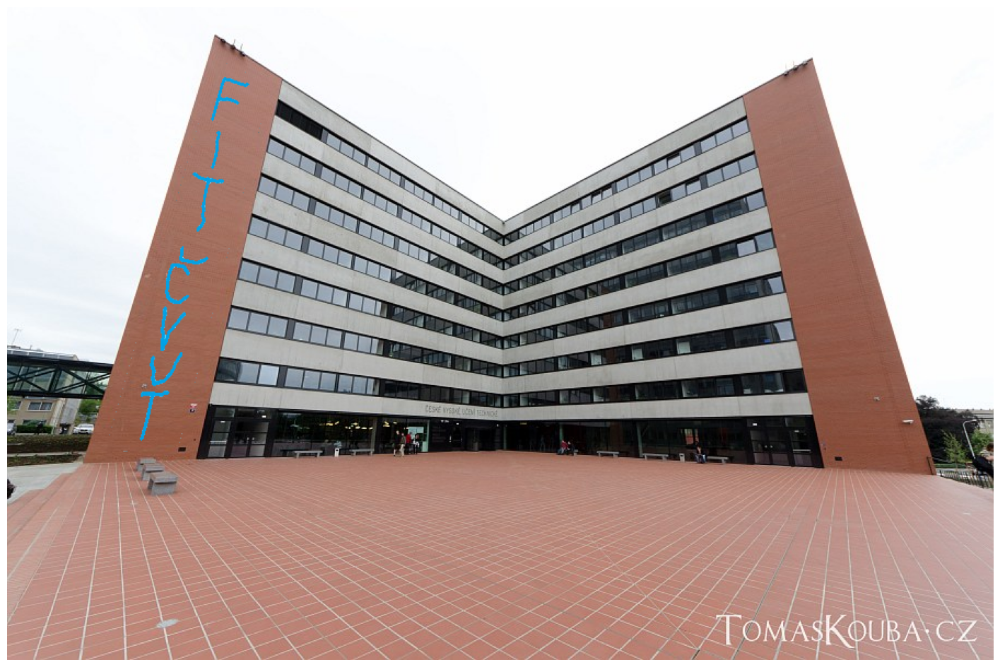

In [ ]:
merged_img = merge_images(main_img, logo_to_merge)
plot_images(merged_img)

Now let's try without median filtration.

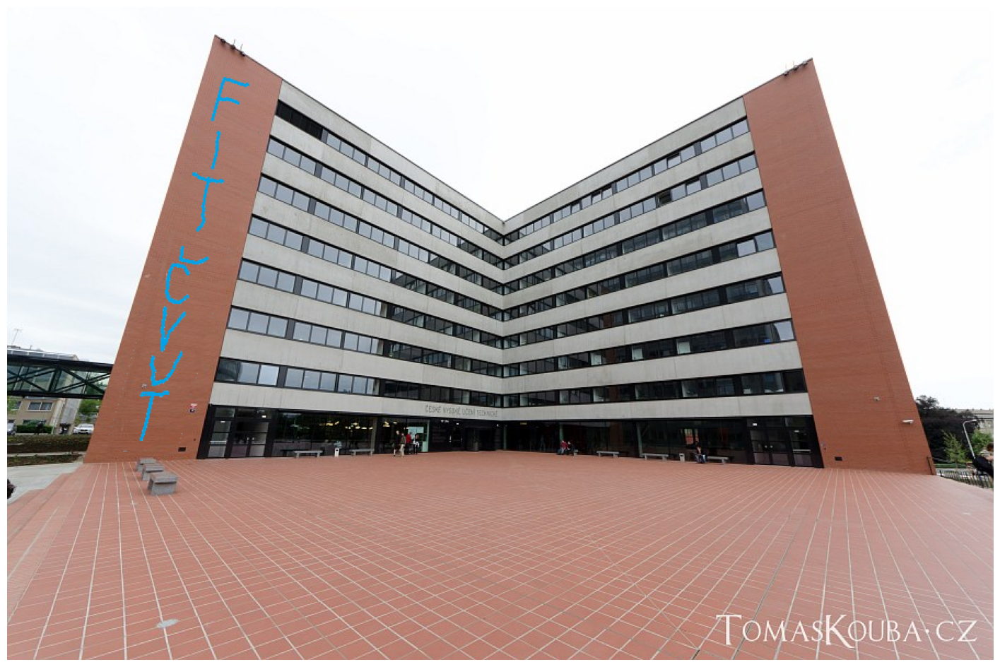

In [ ]:
gray_warped_logo = to_gray(warped_logo)
mask = segmentation_two_thresholds(gray_warped_logo, 120, 150)

logo_to_merge = apply_mask(warped_logo, mask)

merged_img = merge_images(main_img, logo_to_merge)
plot_images(merged_img)

It seems to me that without filtering the photo, the result turned out even better. In the mentioned letter 'V', unnecessary pixels are not segmented, unlike the version with filtering. Therefore, let's save this image.

In [ ]:
save_image(merged_img, "merged_image.jpg")

True

That's all!